# Project 1st : Fake face detection

## Problem statement:

Fake videos can now be created using a machine learning technique called a “generative adversarial network”, or a GAN. A graduate student, Ian Goodfellow, invented GANs in 2014 as a way to algorithmically generate new types of data out of existing data sets. This technique can help us in many ways but there is always an opposite site of any technology in this world.Today people are using GAN for frauds like, they can easily make false identities. 
         And this will also affect areas like  media. Because fake news can easily generate chaos in the socity. And fake facial images play a major role in this. so we know that we have the technology now to generate random faces which looks like real but we also have the same technology which can help us in solving this problem and that is machine learnig.

## The resources used in this project
   1. For the fake facial image data set i used the 1 million fake face data set which i got from the link.
      
      https://archive.org/download/1mFakeFaces
      
    
   2. For the real facial image data set i used celeb_hq data set in the size of 256x256 from the given link.
   
      https://www.tensorflow.org/datasets/catalog/celeb_a_hq
      
    
   3. I implemented the Research paper to solve this problem. with some modification for this problem.
   
      https://www.mdpi.com/2076-3417/8/12/2610/htm
      
    
   4. And for the improvement of the model i used another new technique called as gram block mention in this research paper.
   
      https://openreview.net/forum?id=HyxcZT4KwB

### 1. Importing all the important libraries

In [1]:
import numpy as np
import os
import glob
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import pickle
import tensorflow as tf
from tensorflow import keras 
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import Dense, Input, Conv2D, Flatten, MaxPooling2D, Activation, Dropout, Average , BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.models import load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import binary_crossentropy
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras import callbacks
from tensorflow.keras import backend as K
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.preprocessing import OneHotEncoder
from sklearn.utils import compute_class_weight
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import roc_auc_score , f1_score
import scipy
from sklearn.manifold import TSNE
import seaborn as sns
import tensorflow_addons as tfa
from keras.utils import to_categorical

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm
Using TensorFlow backend.


In [2]:
from google.colab import drive
drive.mount('/gdrive')
%cd /gdrive

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /gdrive
/gdrive


### 2. Visualizing the images real and fake both

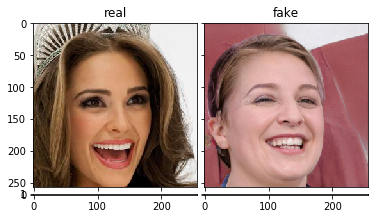

In [2]:
#https://matplotlib.org/3.1.1/gallery/axes_grid1/simple_axesgrid.html
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import matplotlib.image as mpimg
import cv2 , glob

im1 = mpimg.imread("C:\\Users\\my pc\\Downloads\\data256x256\\00001.jpg")
im2 = mpimg.imread("C:\\Users\\my pc\\Downloads\\1m_faces_00\\00001.jpg")

dim = (256, 256)
# resize image
im3 = cv2.resize(im1, dim, interpolation = cv2.INTER_AREA)
im4 = cv2.resize(im2, dim, interpolation = cv2.INTER_AREA)

fig = plt.figure(figsize=(6., 6.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(2, 2),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
                 )

for ax, im , legend in zip(grid, [im3, im4] , ["real" , "fake"]):
    # Iterating over the grid returns the Axes.
    ax.set_title(legend)
    ax.imshow(im)
    
plt.show()


### 3. Creating a face detector and alignment using dlib 

In [0]:
#http://dlib.net/face_alignment.py.html


#loding and initializing the face detector
detector = dlib.get_frontal_face_detector()

# loding and initializing the pretrained facial landmark detector model from the dlib lib 
sp = dlib.shape_predictor("C:\\Users\\my pc\\Downloads\\Extra files\\shape_predictor_68_face_landmarks.dat")
n = []

# loding the images
for image in tqdm(glob.iglob("C:\\Users\\my pc\\Downloads\\data256x256\\*.JPG")):
    
    #read the image using openCV library
    img = cv2.imread(image)
    
    # Ask the detector to find the bounding boxes of each face. The 1 in the
    # second argument indicates that we should upsample the image 1 time. This
    # will make everything bigger and allow us to detect more faces
    
    det = detector(img, 1)
        
    # Find the 5 face landmarks we need to do the alignment.
    faces = dlib.full_object_detections()
    for detection in det:
        faces.append(sp(img, detection))
        
    # we are using try and expect block for this code because we need to process the whole file full of pictures 
    # and if we run the code without this block then only a single picture which does not consist the face can currupt
    # the whole loop.
    try:
        # Get the aligned face images
        image = dlib.get_face_chips(img, faces, size=64)# wiht the size of 224 for vgg16 architecture and 64 for our model.
    except RuntimeError:
        #print("no")
        pass
    #converting detected and aligned faces into the gray scale.
    a = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    n.append(a)
    

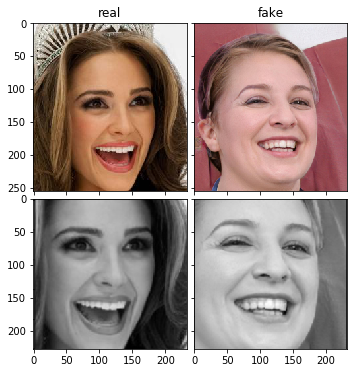

In [12]:
#https://matplotlib.org/3.1.1/gallery/axes_grid1/simple_axesgrid.html

im1 = mpimg.imread("C:\\Users\\my pc\\Downloads\\celeba-dataset\\project_data\\resized images\\vizualization folder\\000001.JPG")
im2 = mpimg.imread("C:\\Users\\my pc\\Downloads\\celeba-dataset\\project_data\\resized images\\vizualization folder\\00001.jpg")
im3 = mpimg.imread("C:\\Users\\my pc\\Downloads\\celeba-dataset\\project_data\\resized images\\vizualization folder\\000002.PNG")
im4 = mpimg.imread("C:\\Users\\my pc\\Downloads\\celeba-dataset\\project_data\\resized images\\vizualization folder\\00002.PNG")

dim = (256, 256)
# resize image
im5 = cv2.resize(im1, dim, interpolation = cv2.INTER_AREA)
im6 = cv2.resize(im2, dim, interpolation = cv2.INTER_AREA)

fig = plt.figure(figsize=(6., 6.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(2, 2),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
                 )

for ax, im , legend in zip(grid, [im5 , im6 , im3 , im4] , ["real" , "fake" , _ , _]):
    # Iterating over the grid returns the Axes.
    ax.set_title(legend)
    ax.imshow(im , cmap='gray')
    
plt.show()

#### 4. loading the pre created numpy file after the face detection alignment and converting in grayscale mode for size 64x64

4.1 Loading the real data

In [3]:
a = np.load("/gdrive/My Drive/my_new2_real_data.npy")
Data_real = a[:20000]
print("shape of data is ==" , Data_real.shape)

shape of data is == (20000, 64, 64)


4.2 Creating the real labels

In [4]:
real_label = ["real"]*Data_real.shape[0]
print(len(real_label) , real_label[:3])

20000 ['real', 'real', 'real']


4.3 Loading the fake data

In [6]:
Data_fake = np.load("/gdrive/My Drive/my_new2_fake_data.npy")
print("shape of data is ==" , Data_fake.shape) 

shape of data is == (20000, 64, 64)


4.4 Creating the fake labels

In [7]:
fake_label = ["fake"]*Data_fake.shape[0]
print(len(fake_label) , fake_label[:3])

20000 ['fake', 'fake', 'fake']


4.5 Conacatenating the final data

In [8]:
final_data = np.concatenate((Data_real , Data_fake)  , axis = 0)
Final_data = final_data.reshape(final_data.shape[0] , final_data.shape[1] , final_data.shape[2] , 1)
print("shape of final data is ==" , Final_data.shape) 

shape of final data is == (40000, 64, 64, 1)


4.6 Encoding the labels and concantenating

In [9]:
label = LabelEncoder()

final_label = []
final_label.extend(real_label)
final_label.extend(fake_label)
y_label = label.fit_transform(final_label)
print("shape of labels is = " , len(final_label))

shape of labels is =  40000


### 5. visualizing the data in the 2d form

In [10]:
tsne_data = final_data.reshape(40000 , 64*64 )
tsne_data.shape

(40000, 4096)

In [0]:
tsne = TSNE(n_components=2, perplexity=50, learning_rate=200)
X_embedding = tsne.fit_transform(tsne_data)

/usr/local/lib/python3.6/dist-packages/seaborn/axisgrid.py:243: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


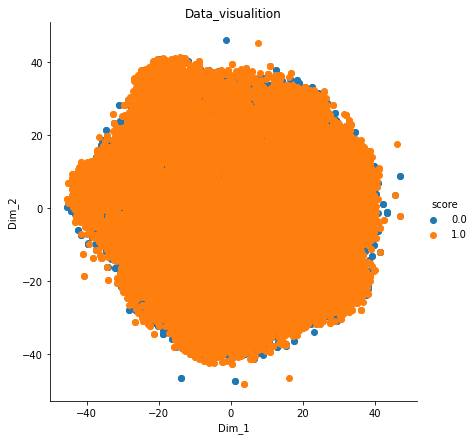

In [0]:
for_tsne = np.hstack((X_embedding, y_label.reshape(-1,1)))
for_tsne_df = pd.DataFrame(data=for_tsne, columns=['Dim_1','Dim_2','score'])
sns.FacetGrid(for_tsne_df, hue="score", size=6).map(plt.scatter, 'Dim_1', 'Dim_2').add_legend()
plt.title('Data_visualition')
plt.show()

#### Observation:

- THE data is highly overlapping which means the distribution of the real and fake image data is nearly similar.

### 6. Loding precreated real and fake data after detection and alignment with size 64

#### 6.1 Dividing data for the vgg16 or base model

In [12]:
X_train, X_test, Y_train, Y_test = train_test_split(Final_data, y_label, test_size=0.2, random_state=42 , stratify = y_label)
X_train, X_cv, Y_train, Y_cv = train_test_split(X_train, Y_train, test_size=0.2, random_state=42 , stratify = Y_train)
print(X_train.shape , len(Y_train))
print(X_cv.shape , len(Y_cv))
print(X_test.shape , len(Y_test))

(25600, 64, 64, 1) 25600
(6400, 64, 64, 1) 6400
(8000, 64, 64, 1) 8000


In [13]:
y_train = to_categorical(Y_train)
y_cv = to_categorical(Y_cv)
y_test = to_categorical(Y_test)
print(y_train.shape)
print(y_cv.shape)
print(y_test.shape)

(25600, 2)
(6400, 2)
(8000, 2)


#### 6.2 Checking the distribution of data in each division.

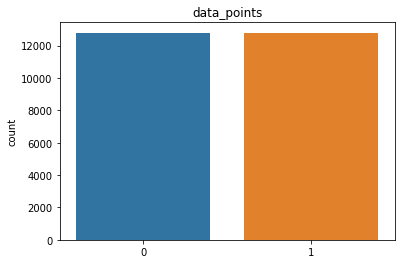

In [14]:
sns.countplot(Y_train)
plt.title("data_points")
plt.show()

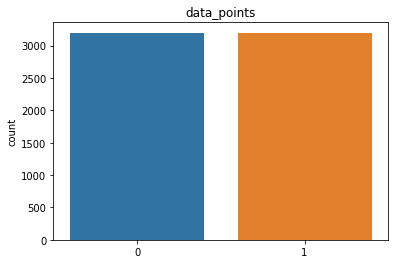

In [15]:
sns.countplot(Y_cv)
plt.title("data_points")
plt.show()

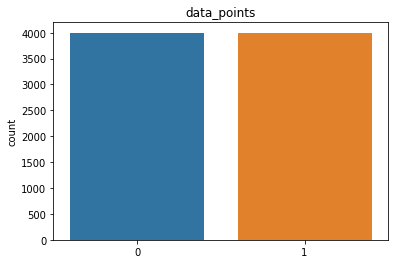

In [16]:
sns.countplot(Y_test)
plt.title("data_points")
plt.show()

#### Observation:
- All the three division train , cv and test has the same distribution of fake and real labels

### 7. Creating additional matrix fuction 

In [0]:
def auc(y_true, y_pred):
    try:
        var = tf.py_function(roc_auc_score, (y_true, y_pred), tf.double)
        return var
    except ValueError:
        pass

In [0]:
f1_score = tfa.metrics.F1Score(num_classes = 2,   average='macro',
    threshold=None,
    name='f1_score',
    dtype=tf.float32)

### 8. Creating the model vgg16

In [0]:
#https://towardsdatascience.com/step-by-step-vgg16-implementation-in-keras-for-beginners-a833c686ae6c
def create_model1():
    model = Sequential()

    model.add(Conv2D(input_shape=(64,64,1),filters=64,kernel_size=(3,3),padding="same", activation=tf.nn.relu))

    model.add(Conv2D(filters=64,kernel_size=(3,3),padding="same", activation=tf.nn.relu))

    model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))

    model.add(Conv2D(filters=128, kernel_size=(3,3), padding="same", activation=tf.nn.relu))

    model.add(Conv2D(filters=128, kernel_size=(3,3), padding="same", activation=tf.nn.relu))

    model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))

    model.add(Conv2D(filters=256, kernel_size=(3,3), padding="same", activation=tf.nn.relu))

    model.add(Conv2D(filters=256, kernel_size=(3,3), padding="same", activation=tf.nn.relu))

    model.add(Conv2D(filters=256, kernel_size=(3,3), padding="same", activation=tf.nn.relu))

    model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))

    model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation=tf.nn.relu))

    model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation=tf.nn.relu))

    model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation=tf.nn.relu))

    model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))

    model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation=tf.nn.relu))

    model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation=tf.nn.relu))

    model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation=tf.nn.relu))

    model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))

    model.add(Flatten())

    model.add(Dense(units=4096,activation=tf.nn.relu))
    model.add(BatchNormalization())

    model.add(Dense(units=4096,activation=tf.nn.relu))
    model.add(BatchNormalization())
    model.add(Dense(units=2, activation=tf.nn.softmax))
    return model

### 9. Creating model checkpoints for model 1

In [0]:
logdir = "/gdrive/My Drive/logs"
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir = logdir, histogram_freq=1)
filepath = "/gdrive/My Drive/vgg_16_classifier.h5"
checkpoint = ModelCheckpoint(filepath=filepath,
                                  monitor='val_accuracy',
                                  verbose=1,
                                  save_best_only=True , mode = "max")

In [0]:
model = create_model1()
model.compile(optimizer=Adam(0.001),
                loss=binary_crossentropy,
                metrics=[f1_score , 'accuracy' , auc]) 

### 10. Fit the model and visulaizing the results

In [0]:
model = create_model1()
model.compile(optimizer=Adam(0.001),
                loss=binary_crossentropy,
                metrics=[f1_score , 'accuracy' , auc]) 
model.fit(X_train, y_train, batch_size = 64,
          epochs=500,
          validation_data=(X_cv, y_cv),steps_per_epoch=50,
          callbacks = [tensorboard_callback , checkpoint])

Epoch 1/500
50/50 [==============================] - ETA: 0s - loss: 1.1156 - f1_score: 0.5331 - accuracy: 0.5331 - auc: 0.5418
Epoch 00001: val_accuracy improved from -inf to 0.50000, saving model to /gdrive/My Drive/vgg_16_classifier.h5
50/50 [==============================] - 25s 505ms/step - loss: 1.1156 - f1_score: 0.5331 - accuracy: 0.5331 - auc: 0.5418 - val_loss: 7.5241 - val_f1_score: 0.3333 - val_accuracy: 0.5000 - val_auc: 0.5799
Epoch 2/500
50/50 [==============================] - ETA: 0s - loss: 0.7393 - f1_score: 0.5678 - accuracy: 0.5678 - auc: 0.5803
Epoch 00002: val_accuracy did not improve from 0.50000
50/50 [==============================] - 23s 461ms/step - loss: 0.7393 - f1_score: 0.5678 - accuracy: 0.5678 - auc: 0.5803 - val_loss: 1.6093 - val_f1_score: 0.3333 - val_accuracy: 0.5000 - val_auc: 0.5837
Epoch 3/500
50/50 [==============================] - ETA: 0s - loss: 0.7616 - f1_score: 0.5488 - accuracy: 0.5491 - auc: 0.5932
Epoch 00003: val_accuracy did not impr

### 11. Loading the tensorflow extension and clearing the previous log files

In [0]:
%load_ext tensorboard

In [0]:
!rm -rf /gdrive/My Drive/logs/  

In [0]:
!kill 5992

In [0]:
%tensorboard --logdir "/gdrive/My Drive/logs"

Output hidden; open in https://colab.research.google.com to view.

#### 11.1 Train accuracy

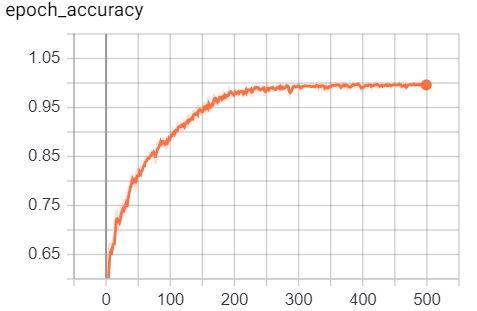

In [14]:
from IPython.display import Image
Image(filename="C:\\Users\\my pc\\Pictures\\Screenshots\\Vgg16_result\\train_accuracy.PNG")

#### 11.2 CV accuracy

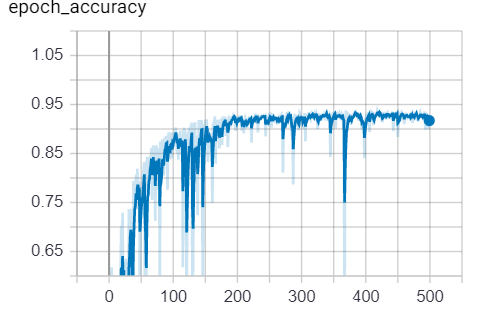

In [16]:
Image(filename="C:\\Users\\my pc\\Pictures\\Screenshots\\Vgg16_result\\cv_accuracy.PNG")

#### 11.3 Train AUC

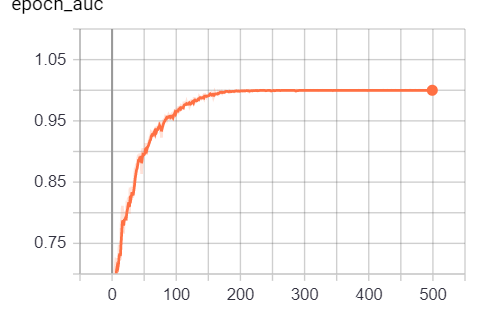

In [17]:
Image(filename="C:\\Users\\my pc\\Pictures\\Screenshots\\Vgg16_result\\train_auc.PNG")

#### 11.4 CV AUC

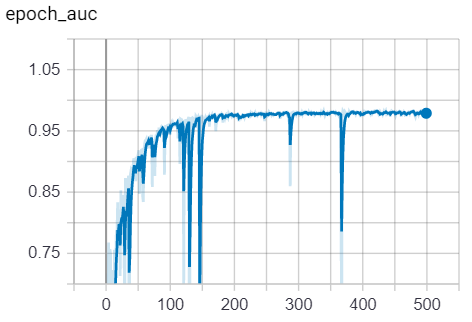

In [18]:
Image(filename="C:\\Users\\my pc\\Pictures\\Screenshots\\Vgg16_result\\cv_auc.PNG")

#### 11.5 Train F1_score

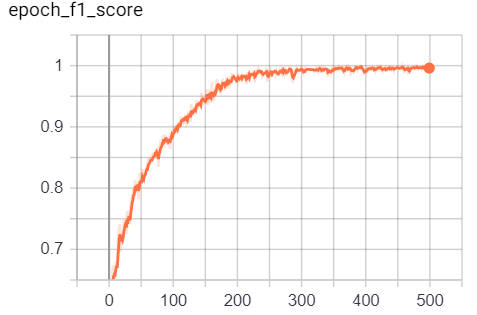

In [19]:
Image(filename="C:\\Users\\my pc\\Pictures\\Screenshots\\Vgg16_result\\train_f1.PNG")

#### 11.6 CV F1_score

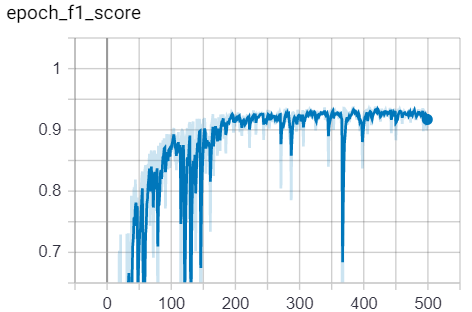

In [20]:
Image(filename="C:\\Users\\my pc\\Pictures\\Screenshots\\Vgg16_result\\cv_f1.PNG")

#### 11.7 Train loss

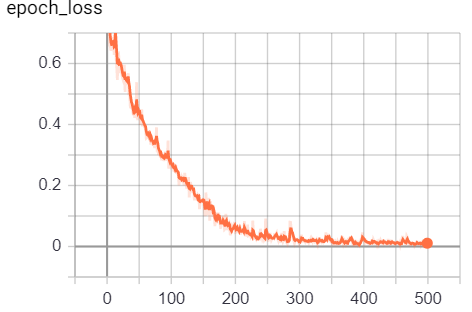

In [21]:
Image(filename="C:\\Users\\my pc\\Pictures\\Screenshots\\Vgg16_result\\train_loss.PNG")

#### 11.8 CV loss

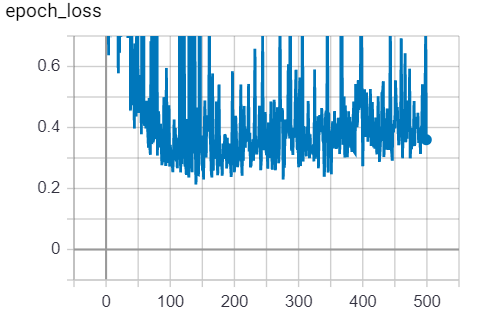

In [22]:
Image(filename="C:\\Users\\my pc\\Pictures\\Screenshots\\Vgg16_result\\cv_loss.PNG")

### 12 Load the saved model and evaluation on the test dataset

In [0]:
model.load_weights('/gdrive/My Drive/vgg_16_classifier.h5')

In [0]:
result = model.evaluate(X_cv , y_cv )
dict(zip(model.metrics_names, result))

200/200 [==============================] - 3s 13ms/step - loss: 0.3445 - f1_score: 0.9380 - accuracy: 0.9380 - auc: 0.9816


{'accuracy': 0.9379687309265137,
 'auc': 0.9816121459007263,
 'f1_score': 0.937958836555481,
 'loss': 0.34445735812187195}

In [0]:
result = model.evaluate(X_test , y_test )
dict(zip(model.metrics_names, result))

250/250 [==============================] - 4s 14ms/step - loss: 0.4160 - f1_score: 0.9271 - accuracy: 0.9271 - auc: 0.9773


{'accuracy': 0.9271249771118164,
 'auc': 0.9773353934288025,
 'f1_score': 0.9271152019500732,
 'loss': 0.415962278842926}

#### 12.1 Confusion matrix

In [0]:
VALUES = {
0: 'FAKE IMAGE',
1: 'REAL IMAGE'}


In [0]:
def confusion_matrix(Y_true, Y_pred):
    Y_true = pd.Series([VALUES[y] for y in np.argmax(Y_true, axis=1)])
    Y_pred = pd.Series([VALUES[y] for y in np.argmax(Y_pred, axis=1)])
    return pd.crosstab(Y_true, Y_pred, rownames=['True'], colnames=['Pred'])

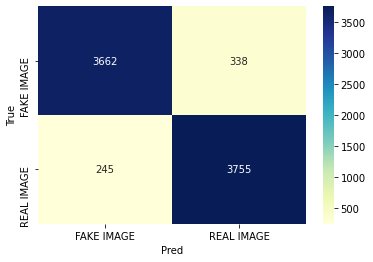

In [0]:
df = pd.DataFrame(confusion_matrix(y_test , model.predict(X_test)))
ax = sns.heatmap(df , annot=True , fmt="d" , cmap="YlGnBu")

### 13. Creating the CG_Face model.

In [0]:
def create_model2():
    model = Sequential()
    
    input_shape = (64,64,1)
    model.add(Conv2D(8, (5, 5), input_shape=input_shape))
    model.add(Activation(tf.nn.relu))
    
    model.add(Conv2D(8, (5, 5) ))
    model.add(Activation(tf.nn.relu))
   
    model.add(MaxPooling2D())
    model.add(Dropout(0.2))
    
    
    model.add(Conv2D(16, (3, 3)))
    model.add(Activation(tf.nn.relu))

    model.add(MaxPooling2D( ))
    model.add(Dropout(0.2))
    
    model.add(Conv2D(32, (3, 3)))
    model.add(Activation(tf.nn.relu))
    
    model.add(MaxPooling2D( ))
    model.add(Dropout(0.2))
    
    model.add(Conv2D(64, (3, 3)))
    model.add(Activation(tf.nn.relu))
    model.add(BatchNormalization())

    model.add(Flatten())
    model.add(Dense(256))
    model.add(Activation(tf.nn.relu))
    model.add(Dense(2))
    model.add(Activation(tf.nn.softmax))
    
    return model

In [0]:
logdir = "/gdrive/My Drive/logs"
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir = logdir, histogram_freq=1)
filepath = "/gdrive/My Drive/CG_FACE_Classifier.h5"
checkpoint = ModelCheckpoint(filepath=filepath,
                                  monitor='val_accuracy',
                                  verbose=1,
                                  save_best_only=True , mode = "max")

In [0]:
Model = create_model2()
Model.compile(optimizer=Adam(0.001),
                loss=binary_crossentropy,
                metrics=[f1_score , 'accuracy' , auc])
  
Model.fit(X_train, y_train, batch_size = 64,
          epochs=500,
          validation_data=(X_cv, y_cv),steps_per_epoch=50,
          callbacks = [tensorboard_callback , checkpoint])
          #class_weight = {0:class_weights[0] , 1:class_weights[1]})

Epoch 1/500
50/50 [==============================] - ETA: 0s - loss: 0.6714 - f1_score: 0.8441 - accuracy: 0.6366 - auc: 0.6802
Epoch 00001: val_accuracy improved from -inf to 0.65438, saving model to /gdrive/My Drive/CG_FACE_Classifier.h5
50/50 [==============================] - 2s 46ms/step - loss: 0.6714 - f1_score: 0.8441 - accuracy: 0.6366 - auc: 0.6802 - val_loss: 0.6813 - val_f1_score: 0.6311 - val_accuracy: 0.6544 - val_auc: 0.7840
Epoch 2/500
50/50 [==============================] - ETA: 0s - loss: 0.5672 - f1_score: 0.7150 - accuracy: 0.7150 - auc: 0.7832
Epoch 00002: val_accuracy improved from 0.65438 to 0.72094, saving model to /gdrive/My Drive/CG_FACE_Classifier.h5
50/50 [==============================] - 2s 38ms/step - loss: 0.5672 - f1_score: 0.7150 - accuracy: 0.7150 - auc: 0.7832 - val_loss: 0.6674 - val_f1_score: 0.7190 - val_accuracy: 0.7209 - val_auc: 0.8023
Epoch 3/500
50/50 [==============================] - ETA: 0s - loss: 0.5589 - f1_score: 0.7233 - accuracy: 0.

### 14. Visualizing the result from CG_Face.

#### 14.1 Train accuracy

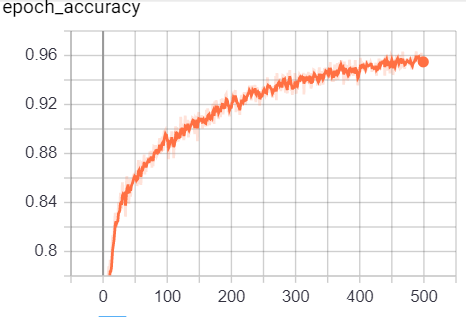

In [23]:
Image(filename="C:\\Users\\my pc\\Pictures\\Screenshots\\cg_face\\train_accuracy.PNG")

#### 14.2 Validation accuracy

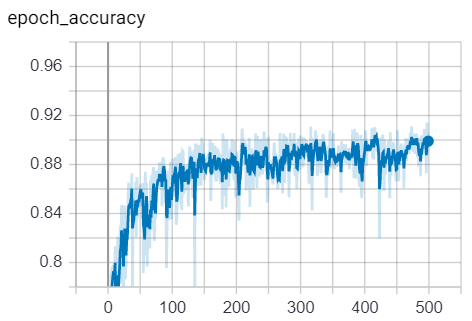

In [24]:
Image(filename="C:\\Users\\my pc\\Pictures\\Screenshots\\cg_face\\cv_accuracy.PNG")

#### 14.3 Train AUC

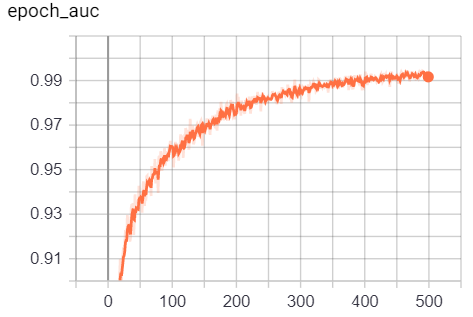

In [25]:
Image(filename="C:\\Users\\my pc\\Pictures\\Screenshots\\cg_face\\train_auc.PNG")

#### 14.4 Validation AUC

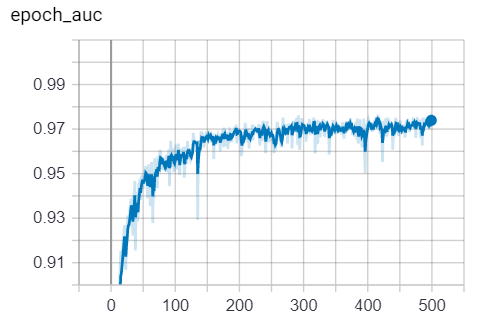

In [26]:
Image(filename="C:\\Users\\my pc\\Pictures\\Screenshots\\cg_face\\cv_auc.PNG")

#### 14.5 Train f1_score

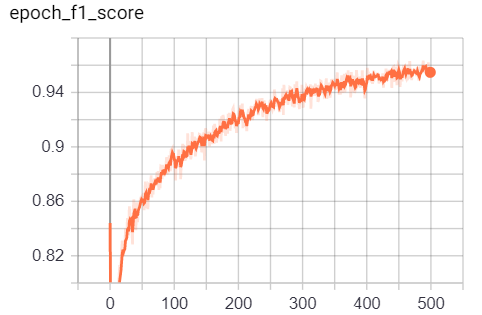

In [27]:
Image(filename="C:\\Users\\my pc\\Pictures\\Screenshots\\cg_face\\train_f1.PNG")

#### 14.6 Validation f1

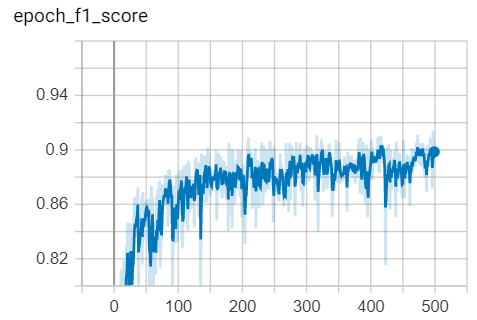

In [28]:
Image(filename="C:\\Users\\my pc\\Pictures\\Screenshots\\cg_face\\cv_f1.PNG")

#### 14.7 Train loss

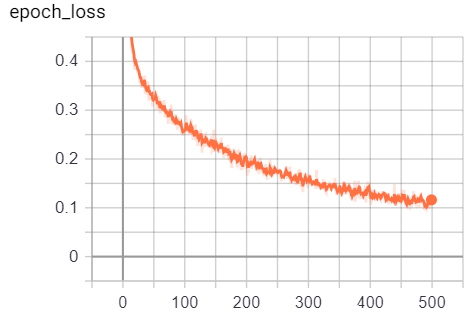

In [29]:
Image(filename="C:\\Users\\my pc\\Pictures\\Screenshots\\cg_face\\train_loss.PNG")

#### 14.8 Validation loss

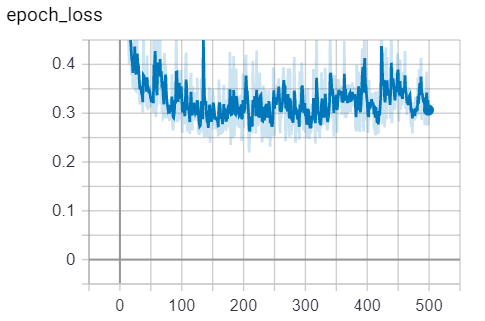

In [30]:
Image(filename="C:\\Users\\my pc\\Pictures\\Screenshots\\cg_face\\cv_loss.PNG")

### 15. Load the best CG_Face and evaluate the result

In [0]:
Model.load_weights('/gdrive/My Drive/CG_FACE_Classifier.h5')

In [0]:
result = Model.evaluate(X_test , y_test )
dict(zip(Model.metrics_names, result))

250/250 [==============================] - 2s 8ms/step - loss: 0.2859 - f1_score: 0.9113 - accuracy: 0.9114 - auc: 0.9707


{'accuracy': 0.9113749861717224,
 'auc': 0.9707314968109131,
 'f1_score': 0.9112639427185059,
 'loss': 0.2859393358230591}

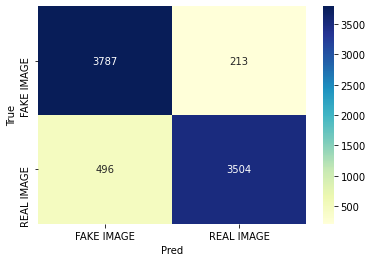

In [0]:
df = pd.DataFrame(confusion_matrix(y_test , Model.predict(X_test)))
ax = sns.heatmap(df , annot=True , fmt="d" , cmap="YlGnBu")

## 16. Upgrading the CG_Face with introducing the gram block

The concept of gram block is taken from this research paper https://openreview.net/forum?id=HyxcZT4KwB

IN the paper they found that for the facial image classification the texture features play an important role due to this they introduced the gram block in their existing resnet architecture and they found that gram block increased the performance of the resnet on the facial image data.

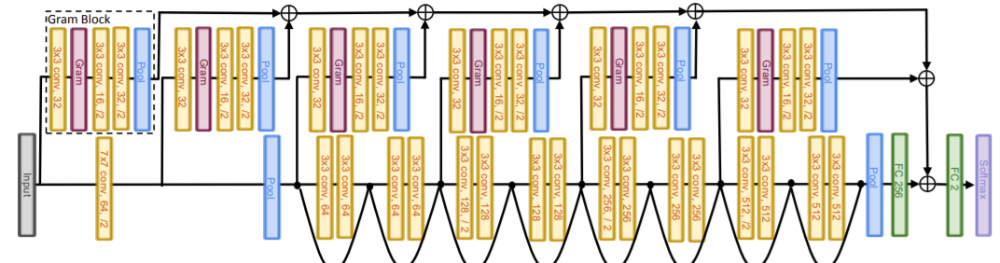

In [35]:
Image(filename="C:\\Users\\my pc\\Pictures\\Screenshots\\Vgg16_result\\gram net.PNG")

In [0]:
%tensorboard --logdir "/gdrive/My Drive/logs"

### 17. Creating model

In [0]:
def create_model3(img_size , channel):


    inputs = tf.keras.Input(shape=(img_size, img_size , channel))
  
    #gram block 1
    gram11 = Conv2D(32, (3, 3), activation=tf.nn.relu)(inputs)
    gram12 = tf.matmul(gram11 , gram11 , transpose_b= True)
    gram13 = Conv2D(16, (3, 3), activation=tf.nn.relu , strides=(2 , 2))(gram12)
    gram14 = Conv2D(16, (3, 3), activation=tf.nn.relu , strides=(2 , 2))(gram13)
    gram15 = MaxPooling2D()(gram14)
    gram16 = tf.keras.layers.Flatten()(gram15)

    layer_1 = Conv2D(8, (5, 5), activation=tf.nn.relu)(inputs)
  
    #gram block 2
    gram21 = Conv2D(32, (3, 3), activation=tf.nn.relu)(layer_1)
    gram22 = tf.matmul(gram21 , gram21 , transpose_b= True)
    gram23 = Conv2D(16, (3, 3), activation=tf.nn.relu , strides=(2 , 2))(gram22)
    gram24 = Conv2D(16, (3, 3), activation=tf.nn.relu , strides=(2 , 2))(gram23)
    gram25 = MaxPooling2D()(gram24)
    gram26 = tf.keras.layers.Flatten()(gram25)


    layer_2 = Conv2D(8, (5, 5), activation=tf.nn.relu)(layer_1)

    max_1 = MaxPooling2D()(layer_2)

    drop_1 = Dropout(0.2)(max_1)

    layer_3 = Conv2D(16, (3, 3), activation=tf.nn.relu)(drop_1)

    #gram block 3
    gram31 = Conv2D(32, (3, 3), activation=tf.nn.relu)(layer_3)
    gram32 = tf.matmul(gram31 , gram31 , transpose_b= True)
    gram33 = Conv2D(16, (3, 3), activation=tf.nn.relu , strides=(2 , 2))(gram32)
    gram34 = Conv2D(16, (3, 3), activation=tf.nn.relu , strides=(2 , 2))(gram33)
    gram35 = MaxPooling2D()(gram34)
    gram36 = tf.keras.layers.Flatten()(gram35)



    max_2   = MaxPooling2D( )(layer_3)

    drop_2  = Dropout(0.2)(max_2)

    layer_4 = Conv2D(32, (3, 3), activation=tf.nn.relu)(drop_2)
  
    #gram block 4
    gram41 = Conv2D(32, (3, 3), activation=tf.nn.relu)(layer_4)
    gram42 = tf.matmul(gram41 , gram41 , transpose_b= True)
    gram43 = Conv2D(16, (3, 3), activation=tf.nn.relu , strides=(1 , 1))(gram42)
    gram44 = Conv2D(16, (3, 3), activation=tf.nn.relu , strides=(1 , 1))(gram43)
    gram45 = MaxPooling2D()(gram44)
    gram46 = tf.keras.layers.Flatten()(gram45)

    max_3  = MaxPooling2D( )(layer_4)

    drop_3  = Dropout(0.2)(max_3)

    layer_5 = Conv2D(64, (3, 3), activation=tf.nn.relu)(drop_3)

    #gram block 4
    #gram51 = Conv2D(32, (3, 3), activation=tf.nn.relu)(layer_5)
    #gram52 = tf.matmul(gram51 , gram51 , transpose_b= True)
    #gram53 = Conv2D(16, (1, 1), activation=tf.nn.relu , strides=(1 , 1))(gram52)
    #gram54 = Conv2D(16, (1, 1), activation=tf.nn.relu , strides=(1 , 1))(gram53)
    #gram55 = MaxPooling2D()(gram54)
    #gram56 = tf.keras.layers.Flatten()(gram54)

    batch = BatchNormalization()(layer_5)
  
    flat = tf.keras.layers.Flatten()(batch)

    dense_1 =  Dense(256 , activation=tf.nn.relu)(flat)

    concat = tf.keras.layers.concatenate([dense_1 , gram16  , gram26 , gram36 , gram46 ])

    dense_2 =  Dense(2 , activation=tf.nn.softmax)(concat)

    model = tf.keras.Model(inputs = inputs , outputs = dense_2)

    return model  


In [0]:
model = create_model3(64 , 1)
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 64, 64, 1)]  0                                            
__________________________________________________________________________________________________
conv2d_44 (Conv2D)              (None, 60, 60, 8)    208         input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_48 (Conv2D)              (None, 56, 56, 8)    1608        conv2d_44[0][0]                  
__________________________________________________________________________________________________
max_pooling2d_21 (MaxPooling2D) (None, 28, 28, 8)    0           conv2d_48[0][0]                  
______________________________________________________________________________________________

In [0]:
%tensorboard --logdir "/gdrive/My Drive/logs"

Output hidden; open in https://colab.research.google.com to view.

In [0]:
logdir = "/gdrive/My Drive/logs"
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir = logdir, histogram_freq=1)
filepath = "/gdrive/My Drive/CG_Face_Modified.h5"
checkpoint = ModelCheckpoint(filepath=filepath,
                                  monitor='val_accuracy',
                                  verbose=1,
                                  save_best_only=True , mode = "max")
model.compile(optimizer=Adam(0.001 ),
                loss=binary_crossentropy,
                metrics=[f1_score , 'accuracy' , auc])

In [0]:
model.fit(X_train, y_train, batch_size = 64,
          epochs=500, 
          validation_data=(X_cv, y_cv),steps_per_epoch=50,
          callbacks = [tensorboard_callback , checkpoint])
          #class_weight = {0:class_weights[0] , 1:class_weights[1]})

Epoch 1/500
50/50 [==============================] - ETA: 0s - loss: 0.6234 - f1_score: 0.8375 - accuracy: 0.6538 - auc: 0.7269
Epoch 00001: val_accuracy improved from -inf to 0.63578, saving model to /gdrive/My Drive/CG_Face_Modified.h5
50/50 [==============================] - 8s 156ms/step - loss: 0.6234 - f1_score: 0.8375 - accuracy: 0.6538 - auc: 0.7269 - val_loss: 0.6721 - val_f1_score: 0.6177 - val_accuracy: 0.6358 - val_auc: 0.7318
Epoch 2/500
50/50 [==============================] - ETA: 0s - loss: 0.5510 - f1_score: 0.7200 - accuracy: 0.7200 - auc: 0.8066
Epoch 00002: val_accuracy improved from 0.63578 to 0.64219, saving model to /gdrive/My Drive/CG_Face_Modified.h5
50/50 [==============================] - 7s 142ms/step - loss: 0.5510 - f1_score: 0.7200 - accuracy: 0.7200 - auc: 0.8066 - val_loss: 0.6035 - val_f1_score: 0.5988 - val_accuracy: 0.6422 - val_auc: 0.8424
Epoch 3/500
50/50 [==============================] - ETA: 0s - loss: 0.4965 - f1_score: 0.7577 - accuracy: 0.75

### 18. Visualizing the result from Upgraded CG_Face.

#### 18.1 Train accuracy

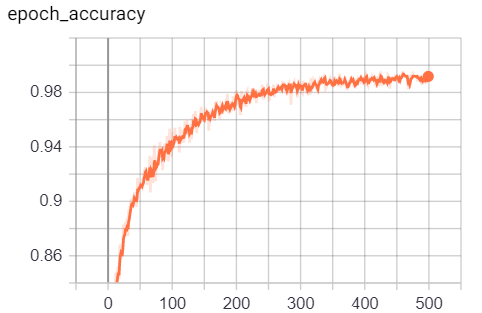

In [36]:
Image(filename="C:\\Users\\my pc\\Pictures\\Screenshots\\train_accuracy.PNG")

#### 18.2 Validation accuracy

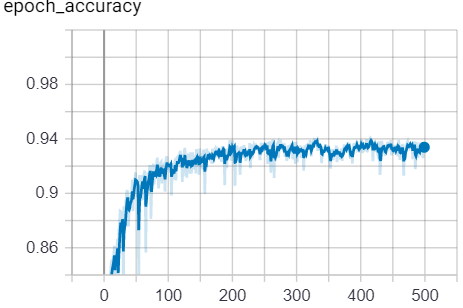

In [37]:
Image(filename="C:\\Users\\my pc\\Pictures\\Screenshots\\cv_accuracy.PNG")

#### 18.3 Train AUC

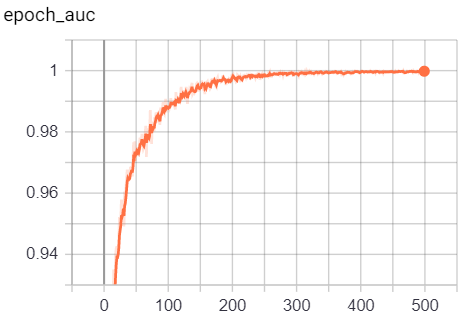

In [39]:
Image(filename="C:\\Users\\my pc\\Pictures\\Screenshots\\trian_auc.PNG")

#### 18.4 Validation AUC

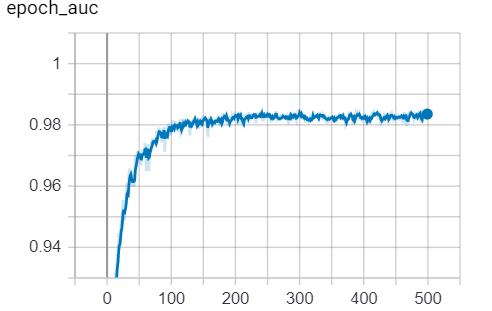

In [40]:
Image(filename="C:\\Users\\my pc\\Pictures\\Screenshots\\cv_auc.PNG")

#### 18.5 Train f1

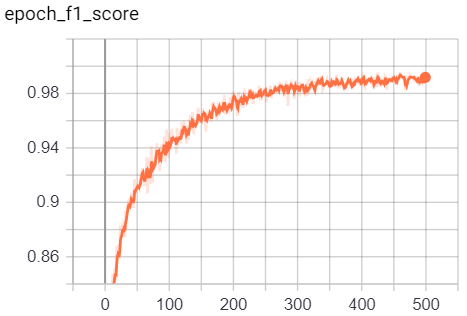

In [42]:
Image(filename="C:\\Users\\my pc\\Pictures\\Screenshots\\trian_f1.PNG")

#### 18.6 Validation f1

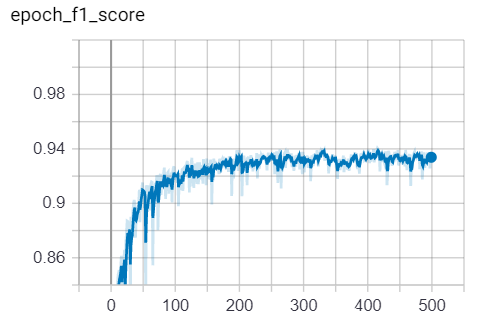

In [43]:
Image(filename="C:\\Users\\my pc\\Pictures\\Screenshots\\cv_f1.PNG")

#### 18.7 Train loss

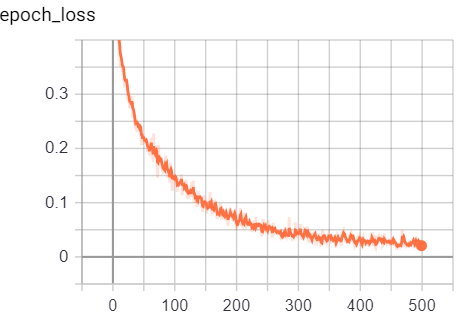

In [44]:
Image(filename="C:\\Users\\my pc\\Pictures\\Screenshots\\trian_loss.PNG")

#### 18.8 Validation loss

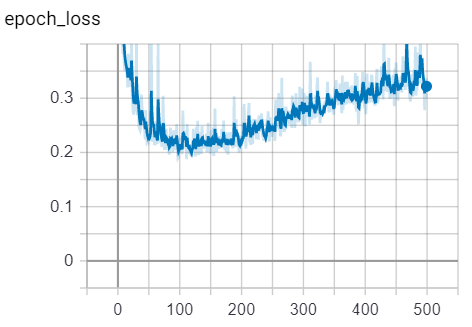

In [45]:
Image(filename="C:\\Users\\my pc\\Pictures\\Screenshots\\cv_loss.PNG")

### 19. Evaluating the results

In [0]:
model.load_weights('/gdrive/My Drive/CG_Face_Modified.h5')

In [0]:
result = model.evaluate(X_test , y_test )
dict(zip(model.metrics_names, result))

250/250 [==============================] - 4s 18ms/step - loss: 0.3037 - f1_score: 0.9357 - accuracy: 0.9358 - auc: 0.9826


{'accuracy': 0.9357500076293945,
 'auc': 0.9826458692550659,
 'f1_score': 0.9357426166534424,
 'loss': 0.3036733567714691}

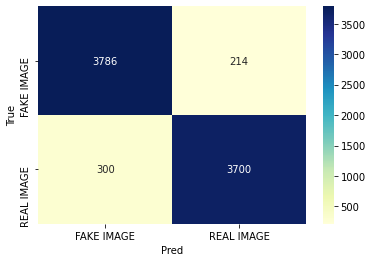

In [0]:
df = pd.DataFrame(confusion_matrix(y_test , model.predict(X_test)))
ax = sns.heatmap(df , annot=True , fmt="d" , cmap="YlGnBu")

### 20. Visualizing the final results

In [46]:
#http://zetcode.com/python/prettytable/
from prettytable import PrettyTable
x = PrettyTable()
x.field_names = ["Model name", "Accuracy", "AUC" , "F1_Score", "Loss"]
x.add_row(["vgg_16"      , 0.9271, 0.9773 , 0.9271, 0.4159])
x.add_row(["CG_Face"     , 0.9112, 0.9707 , 0.9112, 0.2859])
x.add_row(["GRAM CG_Face", 0.9357, 0.9826 , 0.9357, 0.3036])

print(x)

+--------------+----------+--------+----------+--------+
|  Model name  | Accuracy |  AUC   | F1_Score |  Loss  |
+--------------+----------+--------+----------+--------+
|    vgg_16    |  0.9271  | 0.9773 |  0.9271  | 0.4159 |
|   CG_Face    |  0.9112  | 0.9707 |  0.9112  | 0.2859 |
| GRAM CG_Face |  0.9357  | 0.9826 |  0.9357  | 0.3036 |
+--------------+----------+--------+----------+--------+


### Final Observation:
- The first key take away from this experiment is, there is not always complex and higher layer cnn works better since we are getting good result with our CG_Face model which is less complex and have the low no. of cnn layers in comparision with the vgg16. CG_Face face also working with low resolutions because for models we took 64 input shape 

- From the experiment with the gram block we got to know that for the facial image classification problem texture feature is actually important because it is now proven after the experiment that it enhences the power of a CNN model to an extent